In [47]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
import xgboost as xgb
from textblob import TextBlob
from cleanMDA import getXy
from sklearn.metrics import mean_absolute_error
from visuals import getCompFreq, get_GDP_visual

The following analysis explores the predictive capacity of text data extracted from the finanical statements of the most influential companies in the United States on percent change in gross domestic product (GDP). GDP is considered the broadest indicator of economic output and growth and is not only import for investor confidence but is used in the Federal Reserves decision making process for implementing monetary policy for the country. Current indicators used  for economic forecasting in the field of econometrics are vast and include unemployment rate, personal consumption expenditures, business investment, governement spending, inflation, interest rates and net export of goods and services among others. While the field of economietrics has grown in recent years, economists have remained largely unsucessful in consistantly forecasting economic growth rates. 
   

**Data Gathering**

The bulk of the data used in the analysis was gathered from the following sources: 
    - worldbank.org for GDP data
    - sec.gov for 10-K text 
    
Refer to the following notebook for additional details and the code used in gathering the data.
[Data Gathering](scrape_top10_MDA.ipynb)

Below is a look at the ouput of the notebook, which is organized by year and includes tuple pairs of company name and the uncleaned text gathered.

In [59]:
dftop10 = pd.read_pickle('Top10_final.pkl')
dftop10.head(2)

,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,"(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIAL...","(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIAL...","(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIAL...","(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIAL...","(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIAL ST...","(APPLE INC, [7 MANAGEMENTS DISCUSSION AND AN...","(Apple Inc., [7 MANAGEMENTS DISCUSSION AND A...","(Apple Inc., [7 MANAGEMENTS DISCUSSION AND AN...","(Apple Inc., [7 MANAGEMENTS DISCUSSION AND AN...","(Apple Inc., [7 MANAGEMENT’S DISCUSSION AND AN...","(Apple Inc., [7 MANAGEMENT’S DISCUSSION AND AN..."
1,"(GENERAL ELECTRIC CO, \nEX-13\n4\nex13.htm\n\n...","(WALMART INC, \nEX-13\n3\ndex13.htm\nANNUAL RE...","(MICROSOFT CORP, [7 MANAGEMENTS DISCUSSIO...","(APPLE INC, [7 MANAGEMENTS DISCUSSION AND ANA...","(APPLE INC, [7 MANAGEMENTS DISCUSSION AND ANA...","(EXXON MOBIL CORP, [15. EXHIBITS, FINANCIA...","(Exxon Mobil Corp., [15. EXHIBITS, FINANCI...","(Exxon Mobil Corp., [15. EXHIBITS, FINANCI...","(Alphabet Inc. Class A, [7MANAGEMENT’S DISCUSS...","(Alphabet Inc. Class A, [7MANAGEMENT’S DISCUSS...","(Alphabet Inc. Class A, [7MANAGEMENT’S DISCUSS..."


We chose to pull the top 10 companies from the S&P 500 based on market capitalization for a number of reasons. First, given our computational resources pulling data from all companies was not realistic. Additionally, our hypothesis is that the companies that account for the largest market share will be the most influential in predicting economic growth.  

Moreover, we have limited our analysis to the Management Disclosure and Anaalysis (MD&A) section of the comapnies annual 10-K filling. Much of the 10-K report is full of boilerplate language that is heavily regualted and required for companies to include. The MD&A section gives management the most leeway to discuss the health and vitality of the company. This section is widely used by financial analysists and investors. 

**Data Cleaning**

Our next step in the process was to clean the text data in preparation for analysis. The following link provides the code and details of the process, which includes lemitizing and removing punctutation.

[Data Cleaning](Clean_MDAtext.ipynb)



**Data Exploration**

Below is a look at our response variable over time. 

Text(0.5, 1.0, 'GDP from 2007-2017')

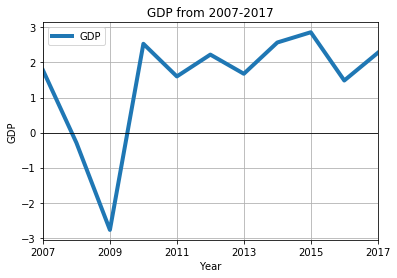

In [60]:
dfGDP = pd.read_csv('gdp_annual.csv')
df_GDP = get_GDP_visual(dfGDP)
df_GDP.plot(linewidth=4)
plt.grid(True)
plt.axhline(y=0,color='black',linestyle='-',lw=.8)
plt.xlabel('Year')
plt.ylabel('GDP')
plt.title('GDP from 2007-2017')

We can clearly see the affect of the financial crisis of 2008/2009 on GDP. We would expect to see more negative sentiment in our text data from these years. For the remaining years we can see relatively small fluctuations and steady positive growth rates. 

Next, we will explore the companies that appear most frequently in our analysis. There are a number of companies that appear over multiple years, most noteably Exxon Mobil and Microsoft are in all 11 years. 

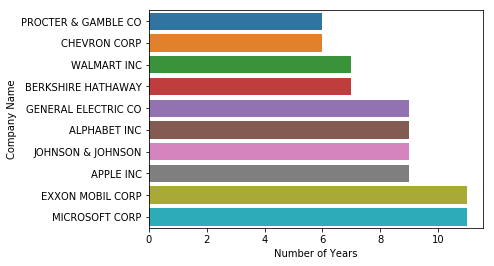

In [15]:
df_freq = getCompFreq(dftop10)
g = sns.barplot(x="Number of Years", y = 'Company Name', data=df_freq)

**Hypothesis and Initial Modeling**

Our hypothesis is that the text from the MD&A section of the top US companies provides significant predictive value for GDP. 

First we will combine our cleaned MDA text and our y variable GDP percent change

In [113]:
dfClean = pd.read_pickle("Cleaned_MDA.pkl")
dfClean = getXy(dfClean)
dfClean.head(3)

,X,y
2007,exhibit financial statement schedule financial...,1.77857
2008,exhibit financial statement schedule financial...,-0.291621
2009,exhibit financial statement schedule financial...,-2.77553


In [63]:
np.mean(dfClean.y)

1.448686839909091

Given the number of years in our analysis is somewhat limited, we will use kfold cross validation to fit the model.

In [23]:
from sklearn.model_selection import KFold

kfold = KFold(n_splits=5, shuffle=True, random_state=2)
kf = KFold(n_splits=5, random_state=2, shuffle=True)
X = np.array(dfClean['X'])
y = np.array(dfClean['y'])
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

We'll start by using word embeddings to try to pick up patterns throughout the years to predict GDP. We've experimented with different ngrams and found ngram equal to (1,3) provides the best results. This model will consider ngrams of length 1 through length 3.  

In [51]:
vectorizer = TfidfVectorizer(ngram_range=(1, 3),max_df=.85)
train_X_vec = vectorizer.fit_transform(X_train).toarray()
test_X_vec = vectorizer.transform(X_test).toarray()

After experimenting with several models including linear and shoastic gradient descent regression, we found XG Boost to provide the best results.

In [52]:
model = xgb.XGBRegressor()
model.fit(train_X_vec, y_train)

[14:46:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

Let's see how we did...

In [49]:
print(y_test)
y_pred = model.predict(test_X_vec)
print(y_pred)
print(model.score(test_X_vec, y_test))
print(mean_absolute_error(y_test, y_pred))

[2.861587025 2.273338548]
[2.4839826 1.5123392]
-3.171268425912121
0.5693018878145446


In [57]:
y


array([1.77857024, -0.29162145899999997, -2.7755295739999997, 2.531920616,
       1.6014546719999998, 2.224030854, 1.67733153, 2.569193594,
       2.861587025, 1.4852791930000002, 2.273338548], dtype=object)

We can see the actual GDP from the test data is 2.9 and 2.3 for the years 2015 and 2017 respectively and our predicted GDP of 2.5 and 1.5. We will use two metrics in the evaluation of models, mean square error (MAE) and R-squared. We choose to assess MAE over RMAE based on the increased interpretability of results that MAE provides. 

We can see from the above model the MAE is 0.57 with an R-squared of -3.2. The negative R-squared value tells our model performs worse than using the mean to make predictions on new y values. Clearly not a good result and we will need to explore a different method but use this as a baseline in order to compare results.

**Sentiment Analysis**

Our word embedding does not seem to be picking up on predictive patterns in the dataset, we'll now explore using sentiment analysis. For this work we will utilize the python library TextBlob. 

In [68]:
import tensorflow_hub as hub
import tensorflow as tf

W0601 17:40:06.313680 4570035648 __init__.py:56] Some hub symbols are not available because TensorFlow version is less than 1.14


In [69]:
elmo = hub.Module("https://tfhub.dev/google/elmo/2", trainable=True)

W0601 17:41:46.908046 4570035648 deprecation.py:323] From /anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/control_flow_ops.py:3632: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.


In [140]:
def elmo_vectors(x):
    embeddings = elmo(x, signature="default", as_dict=True)["elmo"]

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        sess.run(tf.tables_initializer())
        # return average of ELMo features
        return sess.run(tf.reduce_mean(embeddings,1))

In [141]:
x = ['he', 'ran', 'to' ,'the', 'bus', 'with' 'a' 'girl']

In [142]:
x = elmo_vectors(x)

In [91]:
for i in range(len(dfClean['X'])):
    dfClean['X'][i] = np.array(dfClean['X'][i])

In [104]:
dfClean[8:]

,X,y
2015,management discussion analysis financial condi...,2.86159
2016,management discussion analysis financial condi...,1.48528
2017,management discussion analysis financial condi...,2.27334


In [114]:
df_X_train = dfClean.drop(index=['2015','2017'],axis=0, inplace=True)

In [115]:
df_sentences = pd.read_pickle('Cleaned_MDA_sentences.pkl')

In [122]:
df_sentences[2007][0][1]

['.',
 'exhibits',
 'financial',
 'statement',
 'schedules',
 '.',
 'a',
 'and',
 'financial',
 'statements',
 'see',
 'table',
 'of',
 'of',
 'the',
 'financial',
 'section',
 'of',
 'this',
 'report',
 '.',
 'a',
 'exhibits',
 'see',
 'index',
 'to',
 'exhibits',
 'of',
 'this',
 'report',
 '.',
 'table',
 'of',
 'index',
 'to',
 'financial',
 'statements',
 'financial',
 'section',
 'table',
 'of',
 'contents',
 'business',
 'profile',
 'financial',
 'summary',
 'frequently',
 'used',
 'terms',
 'quarterly',
 'information',
 'management',
 'discussion',
 'and',
 'analysis',
 'of',
 'financial',
 'condition',
 'and',
 'results',
 'of',
 'operations',
 'functional',
 'earnings',
 'forward',
 'looking',
 'statements',
 'overview',
 'business',
 'environment',
 'and',
 'risk',
 'assessment',
 'review',
 'of',
 'and',
 'results',
 'liquidity',
 'and',
 'capital',
 'resources',
 'capital',
 'and',
 'exploration',
 'expenditures',
 'taxes',
 'environmental',
 'matters',
 'market',
 'risks'

In [129]:
elmo_train = [elmo_vectors(df_sentences[2007][0][1]) for x in range(len(X_train))]

KeyboardInterrupt: 

In [130]:
elmo_train = elmo_vectors(df_sentences[2007][0][1])

In [132]:
elmo_train[0]

TypeError: 'NoneType' object is not subscriptable

In [93]:
X_train

array(['exhibit financial statement schedule financial statement see table financial section report exhibit see index exhibit report table index financial statement financial section table content business profile financial summary frequently used term quarterly information management discussion analysis financial condition result operation functional earnings forward looking statement overview business environment risk assessment review and result liquidity capital resource capital exploration expenditure tax environmental matter market risk inflation uncertainty recently issued statement financial accounting standard critical accounting policy management report internal control financial reporting report independent registered public accounting firm consolidated financial statement statement income balance sheet statement shareholder equity statement cash flow note consolidated financial statement summary accounting policy accounting change uncertainty income tax miscellaneous financ